In [2]:
import re
import torch
from huggingface_hub import hf_hub_download
from PIL import Image
from transformers import AutoProcessor
from transformers import AutoModelForCausalLM

# Path to your text file
file_path = "/Users/naimsassine/Desktop/DSAI/keys"

# Read the content of the file
with open(file_path, "r") as file:
    content = file.read()

# Regular expressions to match the key, base, and version
mykey = r'hugging_face_key\s*=\s*"([^"]+)"'
mykey = re.search(mykey, content).group(1)

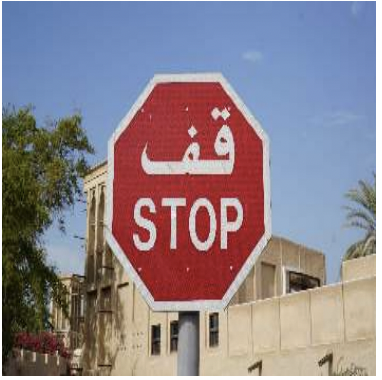

In [3]:
filepath = hf_hub_download(
    repo_id="nielsr/textcaps-sample", filename="stop_sign.png", repo_type="dataset"
)
image = Image.open(filepath).convert("RGB")
image

In [4]:
# the Auto API automatically loads a GitProcessor for us
processor = AutoProcessor.from_pretrained("microsoft/git-base-textcaps")

pixel_values = processor(images=image, return_tensors="pt").pixel_values
pixel_values.shape

torch.Size([1, 3, 224, 224])

In [5]:
model = AutoModelForCausalLM.from_pretrained("microsoft/git-base-textcaps")
# run on the GPU if we have one
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
pixel_values = pixel_values.to(device)

generated_ids = model.generate(pixel_values=pixel_values, max_length=20)
print(
    "Generated caption:",
    processor.batch_decode(generated_ids, skip_special_tokens=True),
)

Generated caption: ['a stop sign with arabic writing on it']


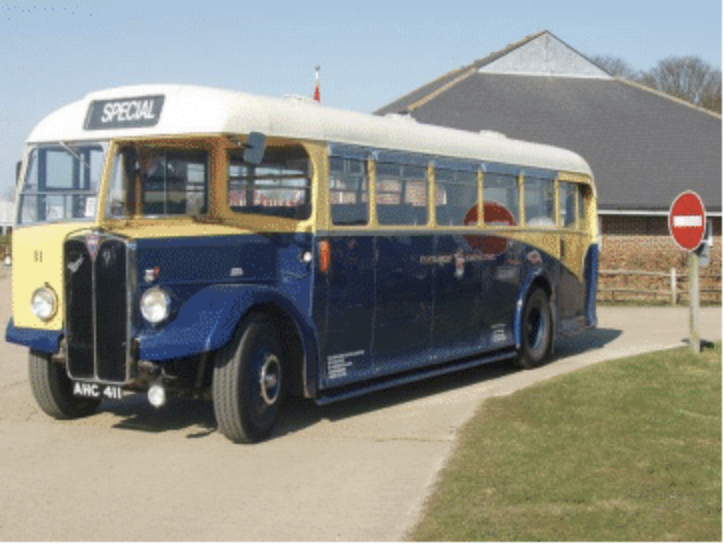

In [6]:
from huggingface_hub import hf_hub_download
from PIL import Image


def prepare_image():
    filepath = hf_hub_download(
        repo_id="nielsr/textvqa-sample", filename="bus.png", repo_type="dataset"
    )
    image = Image.open(filepath).convert("RGB")

    return image


image = prepare_image()
image

In [7]:
from transformers import AutoProcessor, AutoModelForCausalLM
import torch

processor = AutoProcessor.from_pretrained("microsoft/git-base-coco")
model = AutoModelForCausalLM.from_pretrained("microsoft/git-base-coco")

model.to(device)
inputs = processor(images=prepare_image(), return_tensors="pt")
pixel_values = inputs.pixel_values.to(device)

generated_ids = model.generate(pixel_values=pixel_values, max_length=50)

print(
    "Generated caption:",
    processor.batch_decode(generated_ids, skip_special_tokens=True),
)

Generated caption: ['a bus that is parked in a driveway.']


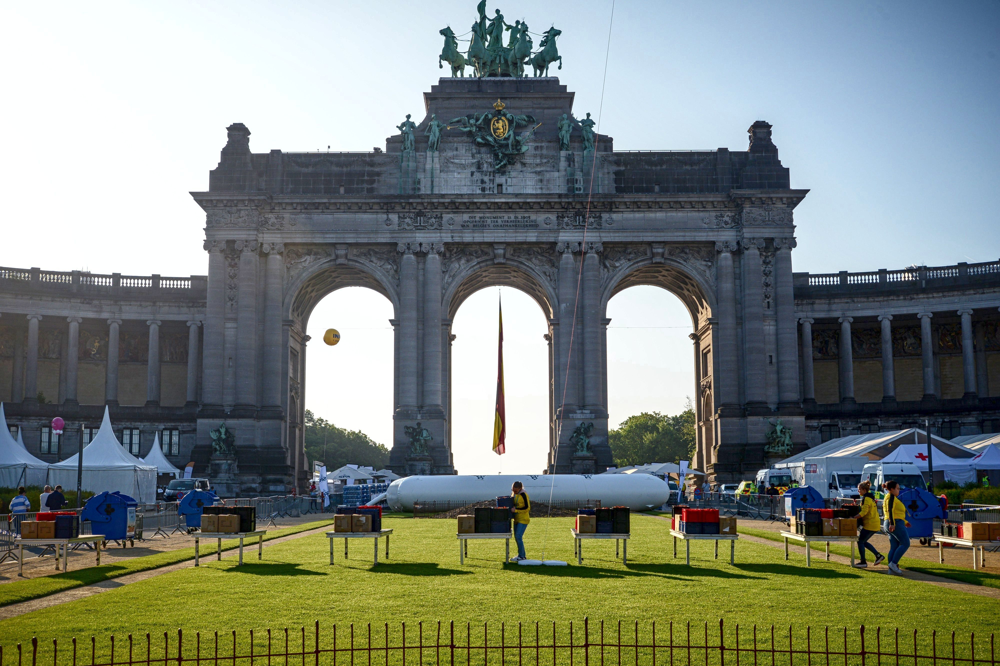

In [8]:
# let's test out more examples and try to push the speed!!!
def load_image(path):
    image = Image.open(path).convert("RGB")

    return image


image_test = load_image("test1.jpg")
image_test

In [10]:
inputs = processor(images=load_image("test2.jpg"), return_tensors="pt")
pixel_values = inputs.pixel_values.to(device)

In [11]:
generated_ids = model.generate(pixel_values=pixel_values, max_length=50)

print(
    "Generated caption:",
    processor.batch_decode(generated_ids, skip_special_tokens=True),
)

Generated caption: ['a view of a city from the roof of a building.']


### video captioning

In [12]:
# video captioning
processor = AutoProcessor.from_pretrained("microsoft/git-base-vatex")
model = AutoModelForCausalLM.from_pretrained("microsoft/git-base-vatex")

In [13]:
from ipywidgets import Video
from huggingface_hub import hf_hub_download

file_path = hf_hub_download(
    repo_id="nielsr/video-demo", filename="eating_spaghetti.mp4", repo_type="dataset"
)
Video.from_file(file_path, width=500)

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free...', width='500')

In [15]:
num_frames = model.config.num_image_with_embedding
print(num_frames)

6


In [16]:
import numpy as np
from decord import VideoReader, cpu


def sample_frames(file_path, num_frames):
    # set seed for reproducability
    np.random.seed(45)

    def sample_frame_indices(clip_len, frame_sample_rate, seg_len):
        converted_len = int(clip_len * frame_sample_rate)
        end_idx = np.random.randint(converted_len, seg_len)
        start_idx = end_idx - converted_len
        indices = np.linspace(start_idx, end_idx, num=clip_len)
        indices = np.clip(indices, start_idx, end_idx - 1).astype(np.int64)
        return indices

    # video clip consists of 300 frames (10 seconds at 30 FPS)
    videoreader = VideoReader(file_path, num_threads=1, ctx=cpu(0))

    # sample 6 frames
    videoreader.seek(0)
    indices = sample_frame_indices(
        clip_len=num_frames, frame_sample_rate=4, seg_len=len(videoreader)
    )
    frames = videoreader.get_batch(indices).asnumpy()

    return list(frames)


frames = sample_frames(file_path, num_frames)

In [17]:
# move model to GPU
model.to(device)
# prepare frames for the model
inputs = processor(images=frames, return_tensors="pt").to(device)

generated_ids = model.generate(pixel_values=inputs.pixel_values, max_length=50)

print(
    "Generated caption:",
    processor.batch_decode(generated_ids, skip_special_tokens=True),
)

/Users/naimsassine/anaconda3/envs/mistral_ai/lib/python3.10/site-packages/transformers/feature_extraction_utils.py:142: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:278.)
  return torch.tensor(value)


Generated caption: ['a woman is sitting at a table and she is talking about the food she is holding.']


In [ ]:
# lets switch all of that to GPU. If it's fast enough then it could be useful to build a project, otherwise not ...
# it's pretty fast, let's try on a real video and see what it gives